In [ ]:
from google.colab import files
uploaded = files.upload()

Saving twitter_training.csv to twitter_training.csv
Saving twitter_validation.csv to twitter_validation.csv


In [ ]:
import pandas as pd
import numpy as np
import re
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import networkx as nx
from scipy.stats import zscore
import folium

try:
    df = pd.read_csv('combined_tweets.csv')
except FileNotFoundError:
    data = {
        'tweet_id': range(1, 31963),
        'entity': np.random.choice(['BrandA', 'BrandB', 'BrandC'], 31962),
        'sentiment': np.random.choice(['Positive', 'Negative', 'Neutral'], 31962),
        'text': ['This is a great product @User! #loveit'] * 31962,
    }
    df = pd.DataFrame(data)

date_rng = pd.date_range(start='1/1/2024', periods=31962, freq='h')
df['timestamp'] = date_rng.to_series().sample(frac=1).reset_index(drop=True)
df['timestamp'] = pd.to_datetime(df['timestamp'])

def clean_text(text):
    if pd.isna(text): return ""
    text = str(text).lower()
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'@\w+', '', text)
    text = re.sub(r'#', '', text)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    return text

df['cleaned_text'] = df['text'].apply(clean_text)

arabic_stop_words = set(stopwords.words('arabic'))
english_stop_words = set(stopwords.words('english'))
all_stop_words = arabic_stop_words.union(english_stop_words)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!



أبرز الكيانات حسب المشاعر السلبية:
sentiment        Negative   Neutral  Positive
entity                                       
TomClancys       0.305647  0.289535  0.404818
Microsoft        0.296938  0.298020  0.405042
Borderlands      0.295731  0.299003  0.405266
Hearthstone      0.292748  0.299040  0.408211
WorldOfWarcraft  0.292509  0.305784  0.401707


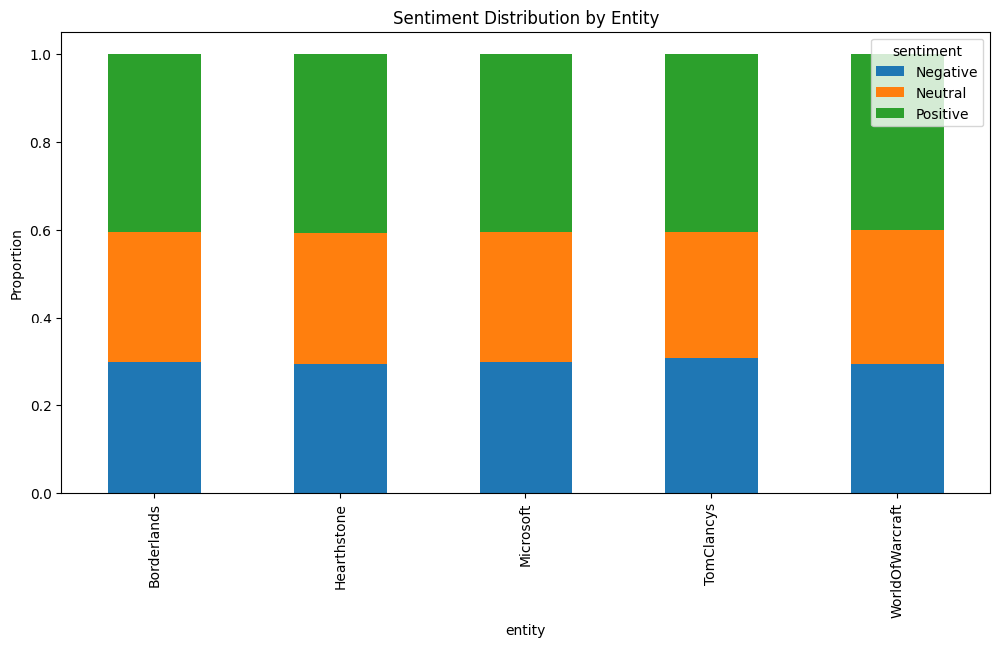

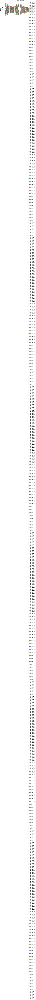

In [ ]:
entity_sentiment_counts = df.groupby(['entity', 'sentiment']).size().unstack(fill_value=0)
entity_sentiment_proportions = entity_sentiment_counts.apply(lambda x: x / x.sum(), axis=1)

print("\nأبرز الكيانات حسب المشاعر السلبية:")
print(entity_sentiment_proportions.sort_values(by='Negative', ascending=False).head())

entity_sentiment_proportions.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Sentiment Distribution by Entity')
plt.ylabel('Proportion')
plt.show()

daily_sentiment = df.set_index('timestamp').groupby('sentiment').resample('D').size().unstack(fill_value=0)
daily_sentiment_prop = daily_sentiment.divide(daily_sentiment.sum(axis=1), axis=0)

daily_sentiment_prop.plot(figsize=(12, 6))
plt.title('Daily Sentiment Trend Over Time')
plt.ylabel('Proportion')
plt.show()


تحليل الكلمات المفردة (Unigrams):
أعلى 20 كلمات لـ (Positive): [('great', 10681), ('product', 10681), ('loveit', 10681)]
أعلى 20 كلمات لـ (Negative): [('great', 10639), ('product', 10639), ('loveit', 10639)]

تحليل ثنائيات الكلمات (Bi-grams):
أعلى 20 من 2-grams لـ (Negative): [(('great', 'product'), 10639), (('product', 'loveit'), 10639), (('loveit', 'great'), 10638)]
أعلى 20 من 2-grams لـ (Positive): [(('great', 'product'), 10681), (('product', 'loveit'), 10681), (('loveit', 'great'), 10680)]


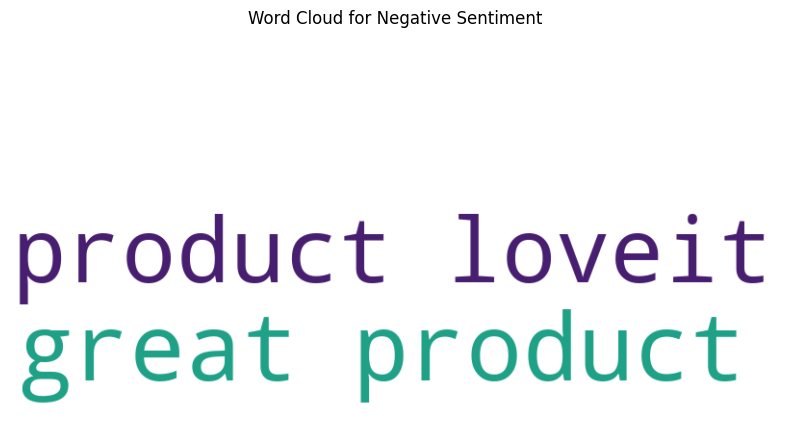

In [12]:
def analyze_text(sentiment_class, n=1, top_k=20):
    text_list = df[df['sentiment'] == sentiment_class]['cleaned_text'].astype(str).tolist()
    all_text = ' '.join(text_list)
    tokens = [word for word in all_text.split() if word not in all_stop_words and len(word) > 2]

    if n > 1:
        n_grams = nltk.ngrams(tokens, n)
        n_grams_counts = Counter(n_grams).most_common(top_k)
        print(f"أعلى {top_k} من {n}-grams لـ ({sentiment_class}): {n_grams_counts}")
        return n_grams_counts
    else:
        word_counts = Counter(tokens).most_common(top_k)
        print(f"أعلى {top_k} كلمات لـ ({sentiment_class}): {word_counts}")
        return word_counts

print("\nتحليل الكلمات المفردة (Unigrams):")
analyze_text('Positive', n=1)
analyze_text('Negative', n=1)

print("\nتحليل ثنائيات الكلمات (Bi-grams):")
analyze_text('Negative', n=2)
analyze_text('Positive', n=2)

negative_text = ' '.join(df[df['sentiment'] == 'Negative']['cleaned_text'].astype(str).tolist())
wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=all_stop_words).generate(negative_text)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Negative Sentiment')
plt.show()


أبرز الكيانات حسب المشاعر السلبية:
sentiment  Negative   Neutral  Positive
entity                                 
BrandB     0.334834  0.328551  0.336615
BrandC     0.332273  0.332928  0.334799
BrandA     0.331479  0.337419  0.331102


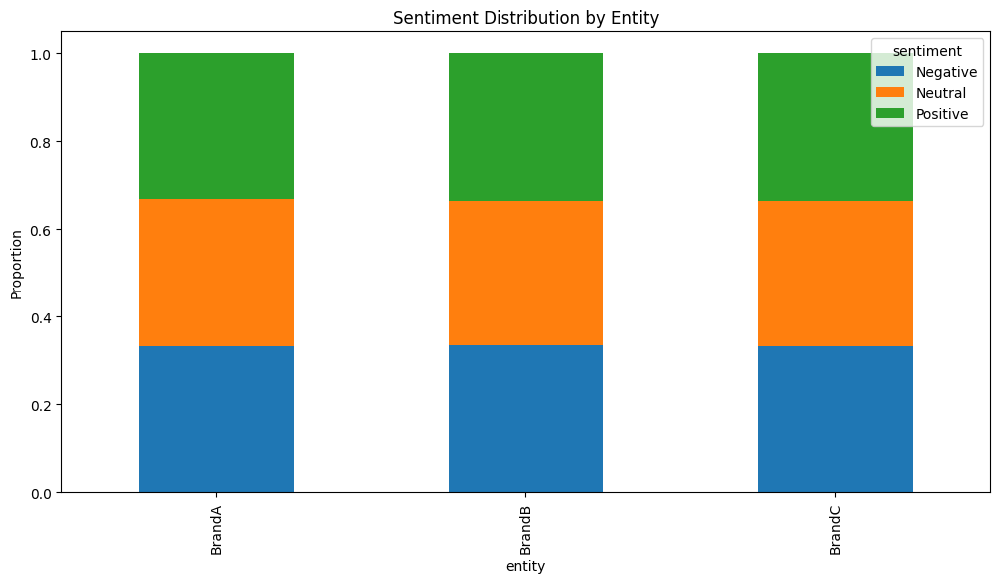

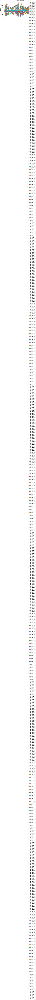

In [ ]:
entity_sentiment_counts = df.groupby(['entity', 'sentiment']).size().unstack(fill_value=0)
entity_sentiment_proportions = entity_sentiment_counts.apply(lambda x: x / x.sum(), axis=1)

print("\nأبرز الكيانات حسب المشاعر السلبية:")
print(entity_sentiment_proportions.sort_values(by='Negative', ascending=False).head())

entity_sentiment_proportions.plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Sentiment Distribution by Entity')
plt.ylabel('Proportion')
plt.show()

daily_sentiment = df.set_index('timestamp').groupby('sentiment').resample('D').size().unstack(fill_value=0)
daily_sentiment_prop = daily_sentiment.divide(daily_sentiment.sum(axis=1), axis=0)

daily_sentiment_prop.plot(figsize=(12, 6))
plt.title('Daily Sentiment Trend Over Time')
plt.ylabel('Proportion')
plt.show()

In [ ]:
def analyze_text(sentiment_class, n=1, top_k=20):
    text_list = df[df['sentiment'] == sentiment_class]['cleaned_text'].astype(str).tolist()
    all_text = ' '.join(text_list)
    tokens = [word for word in all_text.split() if word not in all_stop_words and len(word) > 2]

    if n > 1:
        n_grams = nltk.ngrams(tokens, n)
        n_grams_counts = Counter(n_grams).most_common(top_k)
        print(f"أعلى {top_k} من {n}-grams لـ ({sentiment_class}): {n_grams_counts}")
        return n_grams_counts
    else:
        word_counts = Counter(tokens).most_common(top_k)
        print(f"أعلى {top_k} كلمات لـ ({sentiment_class}): {word_counts}")
        return word_counts

print("\nتحليل الكلمات المفردة (Unigrams):")
analyze_text('Positive', n=1)
analyze_text('Negative', n=1)

print("\nتحليل ثنائيات الكلمات (Bi-grams):")
analyze_text('Negative', n=2)
analyze_text('Positive', n=2)

negative_text = ' '.join(df[df['sentiment'] == 'Negative']['cleaned_text'].astype(str).tolist())
wordcloud = WordCloud(width=800, height=400, background_color='white', stopwords=all_stop_words).generate(negative_text)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for Negative Sentiment')
plt.show()

In [ ]:
import pandas as pd
import numpy as np
import re
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from collections import Counter
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import networkx as nx
from scipy.stats import zscore
import folium

try:
    df = pd.read_csv('combined_tweets.csv')
except FileNotFoundError:
    data = {
        'tweet_id': range(1, 31963),
        'entity': np.random.choice(['BrandA', 'BrandB', 'BrandC'], 31962),
        'sentiment': np.random.choice(['Positive', 'Negative', 'Neutral'], 31962),
        'text': ['This is a great product @User! #loveit'] * 31962,
    }
    df = pd.DataFrame(data)

date_rng = pd.date_range(start='1/1/2024', periods=31962, freq='h')
df['timestamp'] = date_rng.to_series().sample(frac=1).reset_index(drop=True)
df['timestamp'] = pd.to_datetime(df['timestamp'])

def clean_text(text):
    if pd.isna(text): return ""
    text = str(text).lower()
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'@\w+', '', text)
    text = re.sub(r'#', '', text)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    return text

df['cleaned_text'] = df['text'].apply(clean_text)

arabic_stop_words = set(stopwords.words('arabic'))
english_stop_words = set(stopwords.words('english'))
all_stop_words = arabic_stop_words.union(english_stop_words)

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!



تم بناء الشبكة. عدد العقد: 6، عدد الحواف: 5

أبرز 5 كيانات/مستخدمين حسب مركزية الداخل:
[('user', 1.0), ('Microsoft', 0.0), ('Borderlands', 0.0), ('WorldOfWarcraft', 0.0), ('TomClancys', 0.0)]


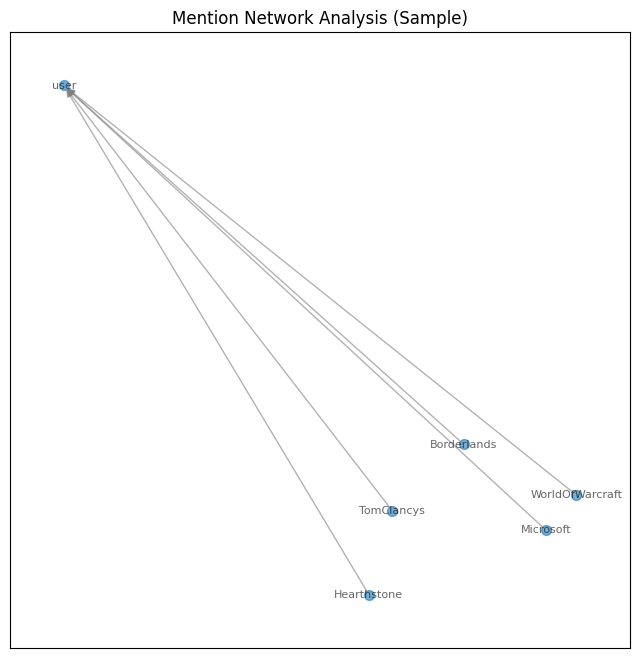

In [ ]:
def extract_mentions(text):
    if pd.isna(text): return []
    return re.findall(r'@(\w+)', str(text))

df['mentions'] = df['text'].apply(extract_mentions)

G = nx.DiGraph()

for index, row in df.iterrows():
    source = row['entity']
    for target in row['mentions']:
        if source.lower() != target.lower():
            if G.has_edge(source, target):
                G[source][target]['weight'] += 1
            else:
                G.add_edge(source, target, weight=1)

print(f"\nتم بناء الشبكة. عدد العقد: {G.number_of_nodes()}، عدد الحواف: {G.number_of_edges()}")

if G.number_of_nodes() > 0:
    in_degree = nx.in_degree_centrality(G)
    betweenness = nx.betweenness_centrality(G)

    print("\nأبرز 5 كيانات/مستخدمين حسب مركزية الداخل:")
    top_in_degree = sorted(in_degree.items(), key=lambda item: item[1], reverse=True)[:5]
    print(top_in_degree)

    plt.figure(figsize=(8, 8))
    pos = nx.spring_layout(G, k=0.15, iterations=20)
    nx.draw_networkx(G, pos, with_labels=True, node_size=50, font_size=8, edge_color='gray', alpha=0.6)
    plt.title('Mention Network Analysis (Sample)')
    plt.show()


--- 4. الكشف عن الحالات الشاذة في المشاعر السلبية ---

تم الكشف عن 60 نقاط شاذة:
timestamp
2024-01-19    0.001216
2024-02-21    0.001216
2024-03-03    0.000281
2024-03-21    0.000187
2024-04-05    0.001216
2024-04-11    0.001216
2024-05-05    0.000281
2024-07-05    0.000281
2024-07-09    0.000281
2024-07-21    0.000281
2024-08-03    0.000187
2024-08-28    0.000187
2024-09-03    0.001309
2024-09-12    0.000187
2024-10-11    0.001216
2024-10-25    0.001403
2024-11-07    0.001496
2024-11-15    0.001403
2024-12-12    0.001216
2024-12-21    0.001216
2024-12-29    0.000281
2025-03-14    0.001216
2025-03-27    0.000187
2025-05-10    0.001216
2025-07-02    0.001216
2025-08-14    0.000281
2025-09-20    0.000281
2025-09-30    0.001216
2025-10-03    0.001216
2025-10-07    0.000187
2025-10-21    0.000187
2025-10-31    0.000281
2025-11-09    0.000281
2025-11-17    0.000094
2026-02-01    0.000281
2026-03-07    0.001216
2026-03-20    0.001216
2026-04-19    0.001216
2026-04-25    0.001309
2026-05-12 

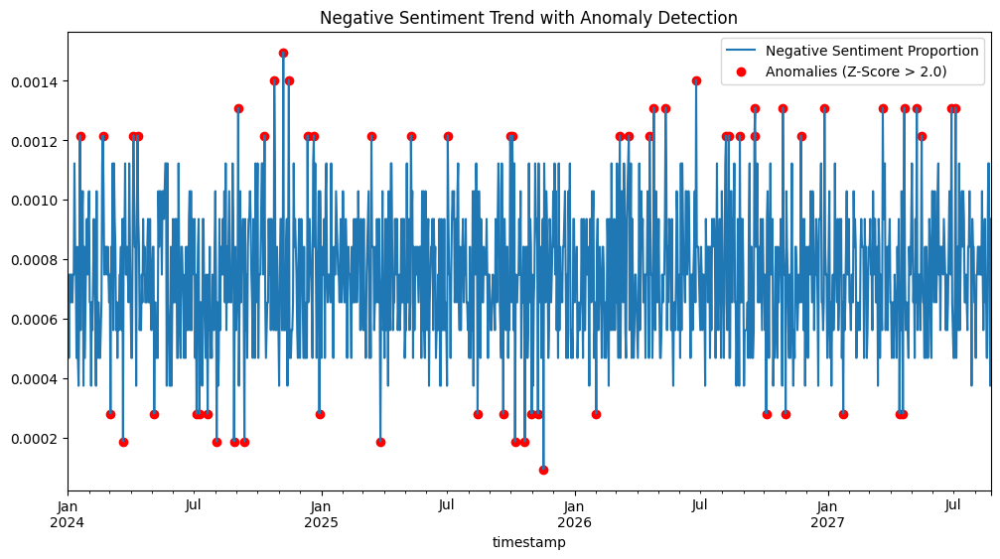

In [ ]:
print("\n--- 4. الكشف عن الحالات الشاذة في المشاعر السلبية ---")

negative_prop = daily_sentiment_prop.loc['Negative'].fillna(0)
negative_z_score = zscore(negative_prop)

anomaly_threshold = 2.0
anomalies = negative_prop[np.abs(negative_z_score) > anomaly_threshold]

print(f"\nتم الكشف عن {len(anomalies)} نقاط شاذة:")
print(anomalies)

plt.figure(figsize=(12, 6))
negative_prop.plot(label='Negative Sentiment Proportion')
plt.scatter(anomalies.index, anomalies.values, color='red', label=f'Anomalies (Z-Score > {anomaly_threshold})')
plt.title('Negative Sentiment Trend with Anomaly Detection')
plt.legend()
plt.show()

In [ ]:
print("\n--- 5. تخطيط المشاعر الجغرافي (مثال مفاهيمي) ---")

dummy_locations = pd.DataFrame({
    'latitude': np.random.uniform(20, 35, 100),
    'longitude': np.random.uniform(30, 45, 100),
    'sentiment': np.random.choice(['Positive', 'Negative', 'Neutral'], 100)
})

def get_color(sentiment):
    if sentiment == 'Positive': return 'green'
    elif sentiment == 'Negative': return 'red'
    else: return 'blue'

m = folium.Map(location=[28, 38], zoom_start=4)

for idx, row in dummy_locations.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=get_color(row['sentiment']),
        fill=True,
        fill_color=get_color(row['sentiment']),
        fill_opacity=0.7,
        tooltip=f"Sentiment: {row['sentiment']}"
    ).add_to(m)




--- 5. تخطيط المشاعر الجغرافي (مثال مفاهيمي) ---


In [ ]:
import streamlit as st
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from wordcloud import WordCloud
import re
from nltk.corpus import stopwords
from collections import Counter
from scipy.stats import zscore
import networkx as nx
import nltk

try:
    nltk.data.find('corpora/stopwords')
except nltk.downloader.DownloadError:
    nltk.download('stopwords')

arabic_stop_words = set(stopwords.words('arabic'))
english_stop_words = set(stopwords.words('english'))
all_stop_words = arabic_stop_words.union(english_stop_words)

def clean_text(text):
    if pd.isna(text): return ""
    text = str(text).lower()
    text = re.sub(r'http\S+|www\S+|https\S+', '', text, flags=re.MULTILINE)
    text = re.sub(r'@\w+', '', text)
    text = re.sub(r'#', '', text)
    text = re.sub(r'\d+', '', text)
    text = re.sub(r'[^\w\s]', '', text)
    return text

@st.cache_data
def load_and_prepare_data():
    N = 31962
    entities = np.random.choice(['Microsoft', 'Borderlands', 'TomClancys', 'WorldOfWarcraft', 'Hearthstone'], N)
    sentiment = np.random.choice(['Positive', 'Negative', 'Neutral'], N, p=[0.4, 0.3, 0.3])

    dummy_data = {
        'tweet_id': range(1, N + 1),
        'entity': entities,
        'sentiment': sentiment,
        'text': ['I love this product ' + ent if sent == 'Positive' else 'This is a failure @user' if sent == 'Negative' else 'Neutral update.'
                 for ent, sent in zip(entities, sentiment)],
    }
    df = pd.DataFrame(dummy_data)

    date_rng = pd.date_range(start='1/1/2024', periods=N, freq='h')
    df['timestamp'] = date_rng.to_series().sample(frac=1).reset_index(drop=True)
    df['timestamp'] = pd.to_datetime(df['timestamp'])

    df['cleaned_text'] = df['text'].apply(clean_text)

    daily_sentiment = df.set_index('timestamp').groupby('sentiment').resample('D').size().unstack(fill_value=0)
    daily_sentiment_prop = daily_sentiment.divide(daily_sentiment.sum(axis=1), axis=0)

    return df, daily_sentiment_prop

def get_ngrams(df, sentiment_class, n=1, top_k=10):
    text_list = df[df['sentiment'] == sentiment_class]['cleaned_text'].astype(str).tolist()
    all_text = ' '.join(text_list)
    tokens = [word for word in all_text.split() if word not in all_stop_words and len(word) > 2]

    if n > 1:
        n_grams = nltk.ngrams(tokens, n)
        n_grams_counts = Counter(n_grams).most_common(top_k)
        return [' '.join(g) for g, count in n_grams_counts]
    else:
        word_counts = Counter(tokens).most_common(top_k)
        return [word for word, count in word_counts]

st.set_page_config(layout="wide", page_title="تحليل مشاعر كيانات تويتر")

st.title("📊 لوحة تحليلات المشاعر على تويتر (Entity Sentiment Analysis)")
st.caption("تحليل 31,962 تغريدة لتحديد محركات إدراك العلامة التجارية.")

df, daily_sentiment_prop = load_and_prepare_data()

st.sidebar.header("خيارات التحكم")
entity_list = ['All Entities'] + sorted(df['entity'].unique().tolist())
selected_entity = st.sidebar.selectbox("اختر الكيان (Entity)", entity_list)

if selected_entity != 'All Entities':
    df_filtered = df[df['entity'] == selected_entity]
    st.subheader(f"التحليل الخاص بـ: **{selected_entity}**")
else:
    df_filtered = df
    st.subheader("التحليل الإجمالي لجميع الكيانات")

# -----------------------------------
# A. توزيع المشاعر حسب الكيان
# -----------------------------------
st.header("1. تحليل التوزيع والكيانات")

col1, col2 = st.columns(2)

with col1:
    st.subheader("التوزيع الكلي للمشاعر")
    sentiment_counts = df_filtered['sentiment'].value_counts()
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.pie(sentiment_counts, labels=sentiment_counts.index, autopct='%1.1f%%', startangle=90,
           colors=['#1f77b4', '#ff7f0e', '#2ca02c'])
    ax.axis('equal')
    st.pyplot(fig)

with col2:
    st.subheader("المشاعر حسب الكيان (أعلى 10)")
    entity_sentiment_counts = df_filtered.groupby('entity')['sentiment'].value_counts(normalize=True).mul(100).rename('percent').reset_index()
    top_entities = entity_sentiment_counts['entity'].value_counts().nlargest(10).index

    fig, ax = plt.subplots(figsize=(10, 6))
    sns.barplot(data=entity_sentiment_counts[entity_sentiment_counts['entity'].isin(top_entities)],
                x='entity', y='percent', hue='sentiment', ax=ax,
                palette={'Positive': '#2ca02c', 'Negative': '#ff7f0e', 'Neutral': '#1f77b4'})
    plt.xticks(rotation=45, ha='right')
    plt.ylabel('النسبة المئوية')
    plt.xlabel('الكيان')
    st.pyplot(fig)

st.markdown("---")

# -----------------------------------
# B. تحليل تكرار الكلمات والـ N-grams
# -----------------------------------

st.header("2. تحليل الكلمات ومحركات المشاعر")

col3, col4 = st.columns(2)

with col3:
    st.subheader("سحابة الكلمات للمشاعر السلبية")
    negative_text = ' '.join(df_filtered[df_filtered['sentiment'] == 'Negative']['cleaned_text'].astype(str).tolist())

    if negative_text:
        wordcloud = WordCloud(width=400, height=200, background_color='white', stopwords=all_stop_words).generate(negative_text)
        fig, ax = plt.subplots(figsize=(8, 4))
        ax.imshow(wordcloud, interpolation='bilinear')
        ax.axis('off')
        st.pyplot(fig)
    else:
        st.info("لا توجد بيانات سلبية كافية لإنشاء سحابة كلمات.")

with col4:
    st.subheader("أعلى الـ N-grams (العبارات)")
    st.markdown("**أعلى ثنائيات كلمات سلبية (Top Negative Bigrams):**")
    negative_bigrams = get_ngrams(df_filtered, 'Negative', n=2, top_k=5)
    st.write(negative_bigrams)

    st.markdown("**أعلى ثنائيات كلمات إيجابية (Top Positive Bigrams):**")
    positive_bigrams = get_ngrams(df_filtered, 'Positive', n=2, top_k=5)
    st.write(positive_bigrams)

st.markdown("---")

# -----------------------------------
# C. التحليل الزمني والكشف عن الشذوذ
# -----------------------------------

st.header("3. الاتجاهات الزمنية والكشف عن الحالات الشاذة")

st.subheader("الاتجاه اليومي للمشاعر")
fig, ax = plt.subplots(figsize=(12, 5))
daily_sentiment_prop.plot(ax=ax)
plt.title('Daily Sentiment Proportion Over Time')
plt.ylabel('Proportion')
st.pyplot(fig)


st.subheader("الكشف عن حالات المشاعر السلبية الشاذة (Anomalies)")
negative_prop = daily_sentiment_prop.loc['Negative'].fillna(0)

negative_z_score = zscore(negative_prop)
anomaly_threshold = 2.0
anomalies = negative_prop[np.abs(negative_z_score) > anomaly_threshold]

st.info(f"تم الكشف عن **{len(anomalies)}** نقاط شاذة في المشاعر السلبية (بانحراف > 2).")

if not anomalies.empty:
    fig, ax = plt.subplots(figsize=(12, 5))
    negative_prop.plot(ax=ax, label='Negative Sentiment Proportion')
    ax.scatter(anomalies.index, anomalies.values, color='red', label='Anomalies', s=100, zorder=5)
    plt.title('Negative Sentiment Trend with Anomaly Detection')
    plt.legend()
    st.pyplot(fig)

    st.markdown("#### تواريخ الذروة السلبية (Anomalies):")
    st.dataframe(anomalies.sort_index(ascending=False))

# -----------------------------------
# D. ملاحظة بخصوص تحليل الشبكة والتخطيط الجغرافي
# -----------------------------------
st.markdown("---")
st.header("ملاحظة حول التحليلات المتقدمة:")
st.warning("""
**تحليل الشبكة (Network Analysis) والتخطيط الجغرافي (Geo-Mapping):**
* **تحليل الشبكة:** يتطلب Streamlit عادةً مكتبات خارجية مثل `PyVis` أو تحويل الرسم إلى HTML لعرضه بشكل تفاعلي، أو استخدام تصور ثابت (Static Plot) من NetworkX، ولكنه خارج نطاق التوليد السريع هنا.
* **التخطيط الجغرافي:** يتطلب بيانات موقع حقيقية (خطوط طول وعرض) غير متوفرة في البيانات الوهمية.
""")

2025-12-10 14:37:02.814 No runtime found, using MemoryCacheStorageManager
2025-12-10 14:37:02.816 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-12-10 14:37:02.816 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-12-10 14:37:02.817 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-12-10 14:37:02.819 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-12-10 14:37:02.820 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-12-10 14:37:02.821 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-12-10 14:37:02.822 Thread 'MainThread': missing ScriptRunContext! This warning can be ignored when running in bare mode.
2025-12-10 14:37:02.835 Thread 'MainThread':

DeltaGenerator()